In [1]:
import pandas as pd

In [2]:
df1=pd.read_csv('vertices_de_power_150601.csv', sep=';')

In [3]:
df2=pd.read_csv('links_de_power_150601.csv',sep=';')

In [4]:
df1.head()

,v_id,lon,lat,typ,voltage,geom
0,1,9.522576,52.360409,substation,220000;110000,010100002031BF0D009E70D94ED02C30414060240EA530...
1,2,9.113210,52.543853,substation,220000,010100002031BF0D002A925DCF9BF52E410D820A365E51...
2,3,9.389745,52.026313,substation,380000;110000,010100002031BF0D002F2B1C491BE62F4141E6F72565F5...
3,4,9.125265,52.538264,substation,380000;220000,010100002031BF0D00CC4265AC17002F41603EA2765E50...
4,5,10.366275,52.284647,substation,380000;220000,010100002031BF0D00D21D8D72B09B31411B7222722B23...


In [5]:
df2.head()

,l_id,v_id_1,v_id_2,voltage,cables,wires,frequency,length_m,r,x,c,i_th_max,geom
0,1,1,2,220000,3.0,2.0,50.0,43379,1.735160,13.88128,498.8585,112.7854,010200002031BF0D00020000009E70D94ED02C30414060...
1,2,3,4,380000,6.0,4.0,50.0,72686,0.227144,18.17150,995.7982,1511.8688,010200002031BF0D00020000002F2B1C491BE62F4141E6...
2,3,5,6,220000,6.0,2.0,50.0,33943,0.678860,10.86176,390.3445,176.5036,010200002031BF0D0002000000D21D8D72B09B31411B72...
3,4,7,5,380000,3.0,4.0,50.0,33471,0.209194,8.36775,458.5527,348.0984,010200002031BF0D00020000006833C2A969D830418D05...
4,5,8,9,380000,6.0,4.0,50.0,28163,0.088009,7.04075,385.8331,585.7904,010200002031BF0D00020000000071C9A4DFB031417644...


In [6]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt

# Assuming df1 and df2 are already loaded

# Create the graph
G = nx.DiGraph()
for _, row in df2.iterrows():
    G.add_edge(row['v_id_1'], row['v_id_2'], weight=row['voltage'])

# Calculate centralities
degree_centrality = nx.degree_centrality(G)
pagerank = nx.pagerank(G, weight='weight')
betweenness = nx.betweenness_centrality(G, weight='weight')

# Add centralities to df1
df1['degree_centrality'] = df1['v_id'].map(degree_centrality)
df1['pagerank'] = df1['v_id'].map(pagerank)
df1['betweenness'] = df1['v_id'].map(betweenness)



In [7]:
df1.head()

,v_id,lon,lat,typ,voltage,geom,degree_centrality,pagerank,betweenness
0,1,9.522576,52.360409,substation,220000;110000,010100002031BF0D009E70D94ED02C30414060240EA530...,0.002092,0.001128,0.000000
1,2,9.113210,52.543853,substation,220000,010100002031BF0D002A925DCF9BF52E410D820A365E51...,0.010460,0.002766,0.000197
2,3,9.389745,52.026313,substation,380000;110000,010100002031BF0D002F2B1C491BE62F4141E6F72565F5...,0.010460,0.002086,0.000171
3,4,9.125265,52.538264,substation,380000;220000,010100002031BF0D00CC4265AC17002F41603EA2765E50...,0.010460,0.002402,0.000395
4,5,10.366275,52.284647,substation,380000;220000,010100002031BF0D00D21D8D72B09B31411B7222722B23...,0.016736,0.002086,0.000110


In [8]:
pos = nx.spring_layout(G, weight='weight')  # Using a different layout
plt.figure(figsize=(100, 100))  # Increasing figure size

nx.draw_networkx_nodes(G, pos, node_size=[v * 80000 for v in degree_centrality.values()], node_color='skyblue')
nx.draw_networkx_edges(G, pos, alpha=0.9, edge_color='gray')
nx.draw_networkx_labels(G, pos, font_size=8)

plt.title("Network Visualization")
plt.show()

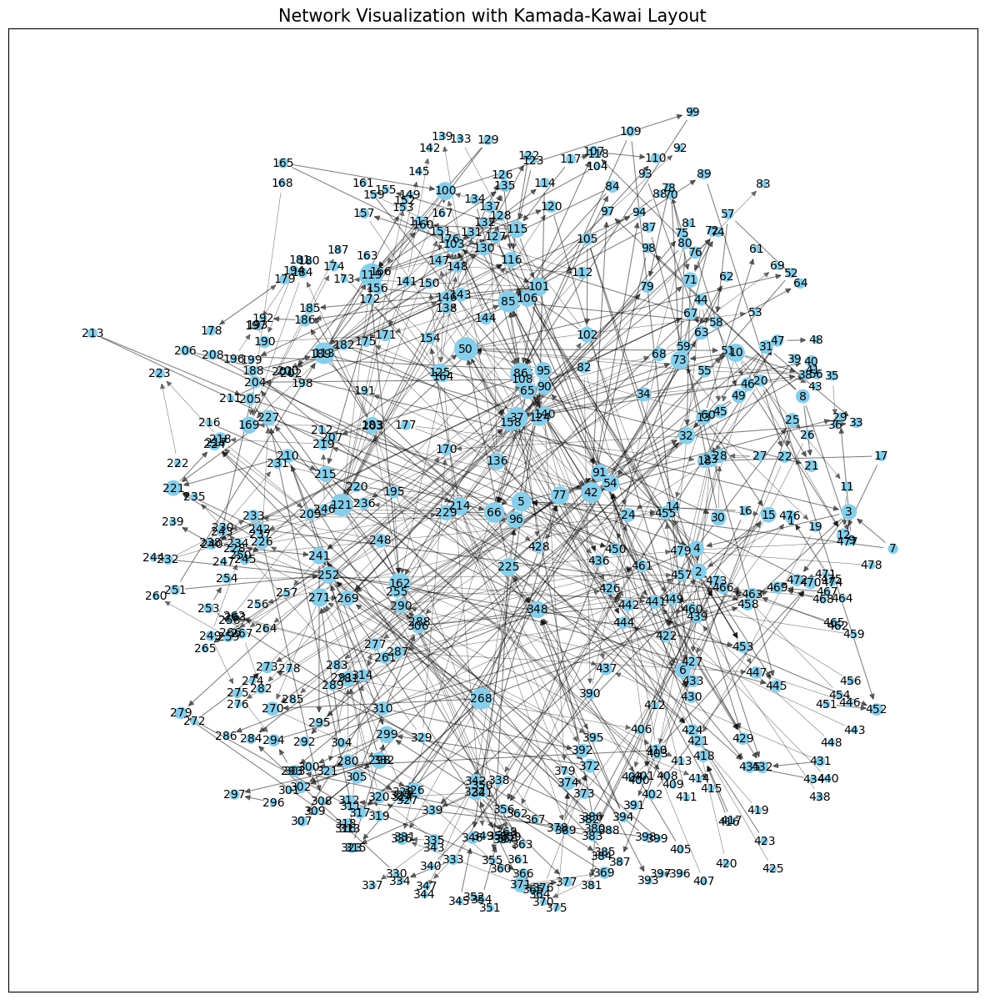

In [9]:
# Assuming G is your graph

# Use kamada_kawai_layout for node positioning
pos = nx.kamada_kawai_layout(G, weight='weight')  

# Increase figure size and DPI for better resolution
plt.figure(figsize=(15, 15), dpi=100)

# Scaling up node sizes and edge widths
node_sizes = [v * 15000 for v in degree_centrality.values()]  # Adjust this scale as needed
edge_widths = [G[u][v]['weight']/500000 for u, v in G.edges()]  # Adjust the divisor as needed

# Draw the network
nx.draw_networkx_nodes(G, pos, node_size=node_sizes, node_color='skyblue')
nx.draw_networkx_edges(G, pos, width=edge_widths, alpha=0.5)
nx.draw_networkx_labels(G, pos, font_size=10)  # Increase font size

plt.title("Network Visualization with Kamada-Kawai Layout", fontsize=15)
plt.show()

In [10]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 479 entries, 0 to 478
Data columns (total 9 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   v_id               479 non-null    int64  
 1   lon                479 non-null    float64
 2   lat                479 non-null    float64
 3   typ                479 non-null    object 
 4   voltage            446 non-null    object 
 5   geom               479 non-null    object 
 6   degree_centrality  479 non-null    float64
 7   pagerank           479 non-null    float64
 8   betweenness        479 non-null    float64
dtypes: float64(5), int64(1), object(3)
memory usage: 33.8+ KB


In [11]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 765 entries, 0 to 764
Data columns (total 13 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   l_id       765 non-null    int64  
 1   v_id_1     765 non-null    int64  
 2   v_id_2     765 non-null    int64  
 3   voltage    765 non-null    int64  
 4   cables     732 non-null    float64
 5   wires      543 non-null    float64
 6   frequency  526 non-null    float64
 7   length_m   765 non-null    int64  
 8   r          534 non-null    float64
 9   x          534 non-null    float64
 10  c          534 non-null    float64
 11  i_th_max   534 non-null    float64
 12  geom       765 non-null    object 
dtypes: float64(7), int64(5), object(1)
memory usage: 77.8+ KB


In [12]:
df1.head()

,v_id,lon,lat,typ,voltage,geom,degree_centrality,pagerank,betweenness
0,1,9.522576,52.360409,substation,220000;110000,010100002031BF0D009E70D94ED02C30414060240EA530...,0.002092,0.000859,0.000000
1,2,9.113210,52.543853,substation,220000,010100002031BF0D002A925DCF9BF52E410D820A365E51...,0.010460,0.003674,0.081929
2,3,9.389745,52.026313,substation,380000;110000,010100002031BF0D002F2B1C491BE62F4141E6F72565F5...,0.010460,0.004015,0.020409
3,4,9.125265,52.538264,substation,380000;220000,010100002031BF0D00CC4265AC17002F41603EA2765E50...,0.010460,0.004431,0.095463
4,5,10.366275,52.284647,substation,380000;220000,010100002031BF0D00D21D8D72B09B31411B7222722B23...,0.016736,0.005728,0.087091


In [12]:
df2.head()

,l_id,v_id_1,v_id_2,voltage,cables,wires,frequency,length_m,r,x,c,i_th_max,geom
0,1,1,2,220000,3.0,2.0,50.0,43379,1.735160,13.88128,498.8585,112.7854,010200002031BF0D00020000009E70D94ED02C30414060...
1,2,3,4,380000,6.0,4.0,50.0,72686,0.227144,18.17150,995.7982,1511.8688,010200002031BF0D00020000002F2B1C491BE62F4141E6...
2,3,5,6,220000,6.0,2.0,50.0,33943,0.678860,10.86176,390.3445,176.5036,010200002031BF0D0002000000D21D8D72B09B31411B72...
3,4,7,5,380000,3.0,4.0,50.0,33471,0.209194,8.36775,458.5527,348.0984,010200002031BF0D00020000006833C2A969D830418D05...
4,5,8,9,380000,6.0,4.0,50.0,28163,0.088009,7.04075,385.8331,585.7904,010200002031BF0D00020000000071C9A4DFB031417644...


In [16]:
# Assuming df1 is your DataFrame with the mentioned columns
# df1 = pd.DataFrame({'degree_centrality': [...], 'pagerank': [...], 'betweeness': [...]})
import numpy as np
def entropy_weight(centrality):
    proportion = centrality / centrality.sum()
    e = -np.sum(proportion * np.log(proportion + np.finfo(float).eps)) / np.log(len(centrality))
    return e

# Calculate entropy for each centrality measure
E_degree = entropy_weight(df1['degree_centrality'])
E_pagerank = entropy_weight(df1['pagerank'])
E_betweenness = entropy_weight(df1['betweenness'])

# Calculate weights
total_entropy = E_degree + E_pagerank + E_betweenness
w1 = (1 - E_degree) / (3 - total_entropy)
w2 = (1 - E_pagerank) / (3 - total_entropy)
w3 = (1 - E_betweenness) / (3 - total_entropy)

# Calculate combined centrality and add it as a new column
df1['combined_centrality'] = w1 * df1['degree_centrality'] + w2 * df1['pagerank'] + w3 * df1['betweenness']

# df1 now contains the combined centrality score in the 'combined_centrality' column

In [17]:
df1.head()

,v_id,lon,lat,typ,voltage,geom,degree_centrality,pagerank,betweenness,combined_centrality
0,1,9.522576,52.360409,substation,220000;110000,010100002031BF0D009E70D94ED02C30414060240EA530...,0.002092,0.001128,0.000000,0.000277
1,2,9.113210,52.543853,substation,220000,010100002031BF0D002A925DCF9BF52E410D820A365E51...,0.010460,0.002766,0.000197,0.001358
2,3,9.389745,52.026313,substation,380000;110000,010100002031BF0D002F2B1C491BE62F4141E6F72565F5...,0.010460,0.002086,0.000171,0.001290
3,4,9.125265,52.538264,substation,380000;220000,010100002031BF0D00CC4265AC17002F41603EA2765E50...,0.010460,0.002402,0.000395,0.001499
4,5,10.366275,52.284647,substation,380000;220000,010100002031BF0D00D21D8D72B09B31411B7222722B23...,0.016736,0.002086,0.000110,0.001843


In [21]:
# Minimum value
min_value = df1['combined_centrality'].min()

# Maximum value
max_value = df1['combined_centrality'].max()

# Quantiles
quantiles = df1['combined_centrality'].quantile([0.25, 0.5, 0.75])

print(f"Minimum Combined Centrality: {min_value}")
print(f"Maximum Combined Centrality: {max_value}")
print("Quantiles:")
print(quantiles)


Minimum Combined Centrality: 0.00027732285204639653
Maximum Combined Centrality: 0.0032075934415733134
Quantiles:
0.25    0.000317
0.50    0.000532
0.75    0.000877
Name: combined_centrality, dtype: float64


In [24]:

# Define the bin edges based on the quantiles
bins = [df1['combined_centrality'].min(), 0.000317, 0.000532, 0.000877, df1['combined_centrality'].max()]

# Define the labels
labels = ['Low', 'Moderate', 'High', 'Severe']

# Create the new column 'criticality_label'
df1['criticality_label'] = pd.cut(df1['combined_centrality'], bins=bins, labels=labels, include_lowest=True)

# View the DataFrame to confirm the new column
df1.head()


,v_id,lon,lat,typ,voltage,geom,degree_centrality,pagerank,betweenness,combined_centrality,criticality_label
0,1,9.522576,52.360409,substation,220000;110000,010100002031BF0D009E70D94ED02C30414060240EA530...,0.002092,0.001128,0.000000,0.000277,Low
1,2,9.113210,52.543853,substation,220000,010100002031BF0D002A925DCF9BF52E410D820A365E51...,0.010460,0.002766,0.000197,0.001358,Severe
2,3,9.389745,52.026313,substation,380000;110000,010100002031BF0D002F2B1C491BE62F4141E6F72565F5...,0.010460,0.002086,0.000171,0.001290,Severe
3,4,9.125265,52.538264,substation,380000;220000,010100002031BF0D00CC4265AC17002F41603EA2765E50...,0.010460,0.002402,0.000395,0.001499,Severe
4,5,10.366275,52.284647,substation,380000;220000,010100002031BF0D00D21D8D72B09B31411B7222722B23...,0.016736,0.002086,0.000110,0.001843,Severe


In [25]:
df1

,v_id,lon,lat,typ,voltage,geom,degree_centrality,pagerank,betweenness,combined_centrality,criticality_label
0,1,9.522576,52.360409,substation,220000;110000,010100002031BF0D009E70D94ED02C30414060240EA530...,0.002092,0.001128,0.000000,0.000277,Low
1,2,9.113210,52.543853,substation,220000,010100002031BF0D002A925DCF9BF52E410D820A365E51...,0.010460,0.002766,0.000197,0.001358,Severe
2,3,9.389745,52.026313,substation,380000;110000,010100002031BF0D002F2B1C491BE62F4141E6F72565F5...,0.010460,0.002086,0.000171,0.001290,Severe
3,4,9.125265,52.538264,substation,380000;220000,010100002031BF0D00CC4265AC17002F41603EA2765E50...,0.010460,0.002402,0.000395,0.001499,Severe
4,5,10.366275,52.284647,substation,380000;220000,010100002031BF0D00D21D8D72B09B31411B7222722B23...,0.016736,0.002086,0.000110,0.001843,Severe
...,...,...,...,...,...,...,...,...,...,...,...
474,475,8.872260,50.129725,substation,110000,010100002031BF0D0076DFB5D90E242E4147B45E1729AD...,0.002092,0.001128,0.000000,0.000277,Low
475,476,8.743261,50.162338,auxillary_T_node,220000,010100002031BF0D00EC51B89EDEB32D411F85EB61B1B2...,0.006276,0.003523,0.000000,0.000841,High
476,477,7.957537,47.572159,substation,220000,010100002031BF0D007137F7078A082B4118E2508E8006...,0.002092,0.001128,0.000000,0.000277,Low
477,478,7.958491,47.579148,generator,NaN,010100002031BF0D00AB3B5A645E092B410C5E8EE1A007...,0.002092,0.001128,0.000000,0.000277,Low


In [26]:
# Count the occurrences of each category
category_counts = df1['criticality_label'].value_counts()

print(category_counts)

Moderate    121
High        120
Severe      120
Low         118
Name: criticality_label, dtype: int64


In [27]:
df1

,v_id,lon,lat,typ,voltage,geom,degree_centrality,pagerank,betweenness,combined_centrality,criticality_label
0,1,9.522576,52.360409,substation,220000;110000,010100002031BF0D009E70D94ED02C30414060240EA530...,0.002092,0.001128,0.000000,0.000277,Low
1,2,9.113210,52.543853,substation,220000,010100002031BF0D002A925DCF9BF52E410D820A365E51...,0.010460,0.002766,0.000197,0.001358,Severe
2,3,9.389745,52.026313,substation,380000;110000,010100002031BF0D002F2B1C491BE62F4141E6F72565F5...,0.010460,0.002086,0.000171,0.001290,Severe
3,4,9.125265,52.538264,substation,380000;220000,010100002031BF0D00CC4265AC17002F41603EA2765E50...,0.010460,0.002402,0.000395,0.001499,Severe
4,5,10.366275,52.284647,substation,380000;220000,010100002031BF0D00D21D8D72B09B31411B7222722B23...,0.016736,0.002086,0.000110,0.001843,Severe
...,...,...,...,...,...,...,...,...,...,...,...
474,475,8.872260,50.129725,substation,110000,010100002031BF0D0076DFB5D90E242E4147B45E1729AD...,0.002092,0.001128,0.000000,0.000277,Low
475,476,8.743261,50.162338,auxillary_T_node,220000,010100002031BF0D00EC51B89EDEB32D411F85EB61B1B2...,0.006276,0.003523,0.000000,0.000841,High
476,477,7.957537,47.572159,substation,220000,010100002031BF0D007137F7078A082B4118E2508E8006...,0.002092,0.001128,0.000000,0.000277,Low
477,478,7.958491,47.579148,generator,NaN,010100002031BF0D00AB3B5A645E092B410C5E8EE1A007...,0.002092,0.001128,0.000000,0.000277,Low


In [28]:
#df1.to_csv('Vertices.csv', index=False)
df2.to_csv('Edges.csv', index=False)

In [29]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 479 entries, 0 to 478
Data columns (total 11 columns):
 #   Column               Non-Null Count  Dtype   
---  ------               --------------  -----   
 0   v_id                 479 non-null    int64   
 1   lon                  479 non-null    float64 
 2   lat                  479 non-null    float64 
 3   typ                  479 non-null    object  
 4   voltage              446 non-null    object  
 5   geom                 479 non-null    object  
 6   degree_centrality    479 non-null    float64 
 7   pagerank             479 non-null    float64 
 8   betweenness          479 non-null    float64 
 9   combined_centrality  479 non-null    float64 
 10  criticality_label    479 non-null    category
dtypes: category(1), float64(6), int64(1), object(3)
memory usage: 38.2+ KB


In [30]:
# Filter df1 to only show rows where 'voltage' is null
null_voltage_df = df1[df1['voltage'].isna()]

# Display the resulting DataFrame
print(null_voltage_df)


     v_id        lon        lat          typ voltage  \
51     52   8.438468  49.252460        plant     NaN   
61     62  13.326405  50.346372   substation     NaN   
80     81   8.141914  53.564001        plant     NaN   
82     83  10.177354  54.339521    generator     NaN   
87     88   7.305614  52.480149        plant     NaN   
92     93  13.335280  49.589690   substation     NaN   
110   111   6.576482  51.055595    generator     NaN   
116   117   6.321651  50.838409        plant     NaN   
133   134   7.006750  51.599911    generator     NaN   
134   135   6.667905  50.993575    generator     NaN   
137   138   7.186678  51.550589    generator     NaN   
138   139   7.351358  51.568369    generator     NaN   
162   163   7.617021  51.637134    generator     NaN   
186   187   6.723652  51.375846    generator     NaN   
191   192   6.683066  51.577105    generator     NaN   
197   198   7.320893  52.471457        plant     NaN   
200   201   7.450342  51.413608        plant    

In [32]:
# Count the unique values and their frequency in the 'typ' column
typ_counts = df1['typ'].value_counts()

# Print the result
print(typ_counts)

substation          404
auxillary_T_node     37
generator            15
plant                12
station               8
sub_station           3
Name: typ, dtype: int64


In [33]:
# Replace 'station' and 'sub_station' with 'substation' in the 'typ' column
df1['typ'] = df1['typ'].replace(['station', 'sub_station'], 'substation')

# Verify the changes by counting the unique values again
typ_counts_updated = df1['typ'].value_counts()

# Print the updated counts
print(typ_counts_updated)

substation          415
auxillary_T_node     37
generator            15
plant                12
Name: typ, dtype: int64


In [34]:
# Drop the 'geom' column from df1
df1 = df1.drop('geom', axis=1)

# Verify the column is dropped by displaying the DataFrame
print(df1.head())

   v_id        lon        lat         typ        voltage  degree_centrality  \
0     1   9.522576  52.360409  substation  220000;110000           0.002092   
1     2   9.113210  52.543853  substation         220000           0.010460   
2     3   9.389745  52.026313  substation  380000;110000           0.010460   
3     4   9.125265  52.538264  substation  380000;220000           0.010460   
4     5  10.366275  52.284647  substation  380000;220000           0.016736   

   pagerank  betweenness  combined_centrality criticality_label  
0  0.001128     0.000000             0.000277               Low  
1  0.002766     0.000197             0.001358            Severe  
2  0.002086     0.000171             0.001290            Severe  
3  0.002402     0.000395             0.001499            Severe  
4  0.002086     0.000110             0.001843            Severe  


In [35]:
df1.to_csv('Vertices.csv', index=False)


In [36]:
# Function to extract the maximum voltage from a cell
def extract_max_voltage(cell):
    if pd.isna(cell):
        return cell
    voltages = cell.split(';')
    max_voltage = max(int(voltage) for voltage in voltages)
    return max_voltage

# Apply the function to the 'voltage' column
df1['voltage'] = df1['voltage'].apply(extract_max_voltage)

# Display the first few rows to verify the changes
df1.head()

,v_id,lon,lat,typ,voltage,degree_centrality,pagerank,betweenness,combined_centrality,criticality_label
0,1,9.522576,52.360409,substation,220000.0,0.002092,0.001128,0.000000,0.000277,Low
1,2,9.113210,52.543853,substation,220000.0,0.010460,0.002766,0.000197,0.001358,Severe
2,3,9.389745,52.026313,substation,380000.0,0.010460,0.002086,0.000171,0.001290,Severe
3,4,9.125265,52.538264,substation,380000.0,0.010460,0.002402,0.000395,0.001499,Severe
4,5,10.366275,52.284647,substation,380000.0,0.016736,0.002086,0.000110,0.001843,Severe


In [39]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 479 entries, 0 to 478
Data columns (total 10 columns):
 #   Column               Non-Null Count  Dtype   
---  ------               --------------  -----   
 0   v_id                 479 non-null    int64   
 1   lon                  479 non-null    float64 
 2   lat                  479 non-null    float64 
 3   typ                  479 non-null    object  
 4   voltage              446 non-null    float64 
 5   degree_centrality    479 non-null    float64 
 6   pagerank             479 non-null    float64 
 7   betweenness          479 non-null    float64 
 8   combined_centrality  479 non-null    float64 
 9   criticality_label    479 non-null    category
dtypes: category(1), float64(7), int64(1), object(1)
memory usage: 34.5+ KB


In [40]:
# Calculate the median, excluding NaN values
median_voltage = df1['voltage'].median()

# Create a new DataFrame 'df_node' by filling NaN values in 'voltage' with the median
df_node = df1.copy()
df_node['voltage'] = df_node['voltage'].fillna(median_voltage)

# Display the first few rows of the new DataFrame
print(df_node.head())

   v_id        lon        lat         typ   voltage  degree_centrality  \
0     1   9.522576  52.360409  substation  220000.0           0.002092   
1     2   9.113210  52.543853  substation  220000.0           0.010460   
2     3   9.389745  52.026313  substation  380000.0           0.010460   
3     4   9.125265  52.538264  substation  380000.0           0.010460   
4     5  10.366275  52.284647  substation  380000.0           0.016736   

   pagerank  betweenness  combined_centrality criticality_label  
0  0.001128     0.000000             0.000277               Low  
1  0.002766     0.000197             0.001358            Severe  
2  0.002086     0.000171             0.001290            Severe  
3  0.002402     0.000395             0.001499            Severe  
4  0.002086     0.000110             0.001843            Severe  


In [42]:
df_node.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 479 entries, 0 to 478
Data columns (total 10 columns):
 #   Column               Non-Null Count  Dtype   
---  ------               --------------  -----   
 0   v_id                 479 non-null    int64   
 1   lon                  479 non-null    float64 
 2   lat                  479 non-null    float64 
 3   typ                  479 non-null    object  
 4   voltage              479 non-null    float64 
 5   degree_centrality    479 non-null    float64 
 6   pagerank             479 non-null    float64 
 7   betweenness          479 non-null    float64 
 8   combined_centrality  479 non-null    float64 
 9   criticality_label    479 non-null    category
dtypes: category(1), float64(7), int64(1), object(1)
memory usage: 34.5+ KB


In [43]:
# Drop the 'geom' column from df2
df2 = df2.drop('geom', axis=1)

# Optionally, display the first few rows of the updated DataFrame
print(df2.head())

   l_id  v_id_1  v_id_2  voltage  cables  wires  frequency  length_m  \
0     1       1       2   220000     3.0    2.0       50.0     43379   
1     2       3       4   380000     6.0    4.0       50.0     72686   
2     3       5       6   220000     6.0    2.0       50.0     33943   
3     4       7       5   380000     3.0    4.0       50.0     33471   
4     5       8       9   380000     6.0    4.0       50.0     28163   

          r         x         c   i_th_max  
0  1.735160  13.88128  498.8585   112.7854  
1  0.227144  18.17150  995.7982  1511.8688  
2  0.678860  10.86176  390.3445   176.5036  
3  0.209194   8.36775  458.5527   348.0984  
4  0.088009   7.04075  385.8331   585.7904  


In [50]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 765 entries, 0 to 764
Data columns (total 11 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   l_id      765 non-null    int64  
 1   v_id_1    765 non-null    int64  
 2   v_id_2    765 non-null    int64  
 3   voltage   765 non-null    int64  
 4   cables    732 non-null    float64
 5   wires     543 non-null    float64
 6   length_m  765 non-null    int64  
 7   r         534 non-null    float64
 8   x         534 non-null    float64
 9   c         534 non-null    float64
 10  i_th_max  534 non-null    float64
dtypes: float64(6), int64(5)
memory usage: 65.9 KB


In [51]:
pip install openpyxl

Note: you may need to restart the kernel to use updated packages.


In [52]:
df2.to_excel('df2.xlsx', index=False)

In [53]:
# Remove rows in df2 where 'r' column is NaN or empty
df2_cleaned = df2.dropna(subset=['r'])

# Optionally, display the first few rows of the updated DataFrame
print(df2_cleaned.head())

   l_id  v_id_1  v_id_2  voltage  cables  wires  length_m         r         x  \
0     1       1       2   220000     3.0    2.0     43379  1.735160  13.88128   
1     2       3       4   380000     6.0    4.0     72686  0.227144  18.17150   
2     3       5       6   220000     6.0    2.0     33943  0.678860  10.86176   
3     4       7       5   380000     3.0    4.0     33471  0.209194   8.36775   
4     5       8       9   380000     6.0    4.0     28163  0.088009   7.04075   

          c   i_th_max  
0  498.8585   112.7854  
1  995.7982  1511.8688  
2  390.3445   176.5036  
3  458.5527   348.0984  
4  385.8331   585.7904  


In [54]:
df2_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 534 entries, 0 to 749
Data columns (total 11 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   l_id      534 non-null    int64  
 1   v_id_1    534 non-null    int64  
 2   v_id_2    534 non-null    int64  
 3   voltage   534 non-null    int64  
 4   cables    534 non-null    float64
 5   wires     534 non-null    float64
 6   length_m  534 non-null    int64  
 7   r         534 non-null    float64
 8   x         534 non-null    float64
 9   c         534 non-null    float64
 10  i_th_max  534 non-null    float64
dtypes: float64(6), int64(5)
memory usage: 50.1 KB


In [55]:
df2_cleaned.to_csv('edges.csv', index=False)

In [56]:
df_node.to_csv('nodes.csv', index=False)

In [57]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 765 entries, 0 to 764
Data columns (total 11 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   l_id      765 non-null    int64  
 1   v_id_1    765 non-null    int64  
 2   v_id_2    765 non-null    int64  
 3   voltage   765 non-null    int64  
 4   cables    732 non-null    float64
 5   wires     543 non-null    float64
 6   length_m  765 non-null    int64  
 7   r         534 non-null    float64
 8   x         534 non-null    float64
 9   c         534 non-null    float64
 10  i_th_max  534 non-null    float64
dtypes: float64(6), int64(5)
memory usage: 65.9 KB


In [58]:
df2.to_csv('edges2.csv', index=False)

In [59]:
from sklearn.impute import KNNImputer
import pandas as pd

# Assuming df2 is your DataFrame loaded from the CSV file

# Create a KNN imputer instance
imputer = KNNImputer(n_neighbors=5)

# Apply KNN imputation on df2
df2_imputed = imputer.fit_transform(df2)

# Convert the imputed array back to a DataFrame
df2_imputed = pd.DataFrame(df2_imputed, columns=df2.columns)

In [60]:
df2_imputed.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 765 entries, 0 to 764
Data columns (total 11 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   l_id      765 non-null    float64
 1   v_id_1    765 non-null    float64
 2   v_id_2    765 non-null    float64
 3   voltage   765 non-null    float64
 4   cables    765 non-null    float64
 5   wires     765 non-null    float64
 6   length_m  765 non-null    float64
 7   r         765 non-null    float64
 8   x         765 non-null    float64
 9   c         765 non-null    float64
 10  i_th_max  765 non-null    float64
dtypes: float64(11)
memory usage: 65.9 KB


In [61]:
df2_imputed.to_csv('edges3.csv', index=False)

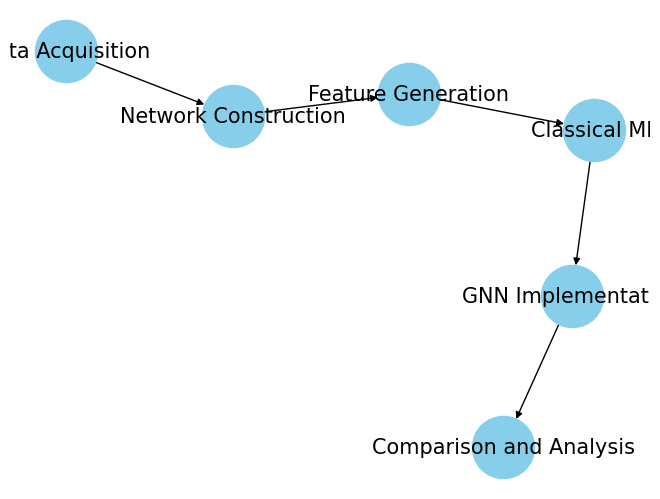

In [1]:
import matplotlib.pyplot as plt
import networkx as nx

G = nx.DiGraph()

# Adding nodes
nodes = ["Data Acquisition", "Network Construction", "Feature Generation", 
         "Classical ML", "GNN Implementation", "Comparison and Analysis"]
G.add_nodes_from(nodes)

# Adding edges
edges = [("Data Acquisition", "Network Construction"), 
         ("Network Construction", "Feature Generation"),
         ("Feature Generation", "Classical ML"),
         ("Classical ML", "GNN Implementation"),
         ("GNN Implementation", "Comparison and Analysis")]
G.add_edges_from(edges)

pos = nx.spring_layout(G)
nx.draw(G, pos, with_labels=True, node_color='skyblue', node_size=2000, edge_color='black', linewidths=1, font_size=15)
plt.show()